In [185]:
import csv
import json
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import matplotlib as mlt
import matplotlib.image as mpimg
import matplotlib.animation as animation
from tqdm.notebook import tqdm
plt.style.use('seaborn-darkgrid')

In [186]:
events = pd.read_csv('./data/0021500495.csv', index_col=None)
events = events.iloc[1:, :]
events

,GAME_ID,EVENTNUM,EVENTMSGTYPE,EVENTMSGACTIONTYPE,PERIOD,WCTIMESTRING,PCTIMESTRING,HOMEDESCRIPTION,NEUTRALDESCRIPTION,VISITORDESCRIPTION,...,PLAYER2_TEAM_CITY,PLAYER2_TEAM_NICKNAME,PLAYER2_TEAM_ABBREVIATION,PERSON3TYPE,PLAYER3_ID,PLAYER3_NAME,PLAYER3_TEAM_ID,PLAYER3_TEAM_CITY,PLAYER3_TEAM_NICKNAME,PLAYER3_TEAM_ABBREVIATION
1,21500495,1,10,0,1,3:11 PM,12:00,Jump Ball Johnson vs. Lopez: Tip to Young,NaN,NaN,...,Brooklyn,Nets,BKN,5,201152,Thaddeus Young,1.610613e+09,Brooklyn,Nets,BKN
2,21500495,2,1,44,1,3:11 PM,11:42,NaN,NaN,Young 1' Reverse Layup (2 PTS) (Johnson 1 AST),...,Brooklyn,Nets,BKN,0,0,NaN,NaN,NaN,NaN,NaN
3,21500495,3,5,1,1,3:11 PM,11:32,Sullinger Bad Pass Turnover (P1.T1),NaN,Lopez STEAL (1 STL),...,Brooklyn,Nets,BKN,0,0,NaN,NaN,NaN,NaN,NaN
4,21500495,4,2,1,1,3:12 PM,11:14,NaN,NaN,MISS Young 21' Jump Shot,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN
5,21500495,5,4,0,1,3:12 PM,11:13,Bradley REBOUND (Off:0 Def:1),NaN,NaN,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
497,21500495,593,8,0,4,5:30 PM,0:11,NaN,NaN,SUB: Ellington FOR Sloan,...,Brooklyn,Nets,BKN,0,0,NaN,NaN,NaN,NaN,NaN
498,21500495,594,5,1,4,5:31 PM,0:10,Smart STEAL (3 STL),NaN,Young Bad Pass Turnover (P1.T14),...,Boston,Celtics,BOS,0,0,NaN,NaN,NaN,NaN,NaN
499,21500495,595,2,1,4,5:31 PM,0:02,MISS Jerebko 3PT Jump Shot,NaN,NaN,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN
500,21500495,596,4,0,4,5:31 PM,0:01,Smart REBOUND (Off:3 Def:0),NaN,NaN,...,NaN,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN


In [187]:
# Read in the SportVU tracking data and convert to dictionary
sportvu = []
with open('./data/0021500495.json', mode='r') as sportvu_json:  
    sportvu = json.load(sportvu_json)
data = pd.DataFrame.from_dict(sportvu)
data['event_id'] = data['events'].apply(lambda x: int(x['eventId']))
data.head()

,gameid,gamedate,events,event_id
0,0021500495,2016-01-02,"{'eventId': '1', 'visitor': {'name': 'Brooklyn...",1
1,0021500495,2016-01-02,"{'eventId': '2', 'visitor': {'name': 'Brooklyn...",2
2,0021500495,2016-01-02,"{'eventId': '3', 'visitor': {'name': 'Brooklyn...",3
3,0021500495,2016-01-02,"{'eventId': '4', 'visitor': {'name': 'Brooklyn...",4
4,0021500495,2016-01-02,"{'eventId': '5', 'visitor': {'name': 'Brooklyn...",5


In [188]:
player_fields = data['events'][0]['home']['players'][0].keys()
home_players = pd.DataFrame(data=[i for i in data['events'][0]['home']['players']], columns=player_fields)
away_players = pd.DataFrame(data=[i for i in data['events'][0]['visitor']['players']], columns=player_fields)
players = pd.merge(home_players, away_players, how='outer')
jerseydict = dict(zip(players.playerid.values, players.jersey.values))
players.to_csv('player_info.csv', index=False)
player_dict = players.set_index('playerid').to_dict(orient='index')
players

,lastname,firstname,playerid,jersey,position
0,Bradley,Avery,202340,0,G
1,Thomas,Isaiah,202738,4,G
2,Sullinger,Jared,203096,7,C-F
3,Jerebko,Jonas,201973,8,F
4,Turner,Evan,202323,11,G-F
5,Young,James,203923,13,G-F
6,Smart,Marcus,203935,36,G
7,Olynyk,Kelly,203482,41,C-F
8,Lee,David,101135,42,F-C
9,Zeller,Tyler,203092,44,C-F


In [189]:
shot_df = events[events['EVENTMSGTYPE'].isin([1, 2])]
data = data[data['event_id'].isin(list(shot_df['EVENTNUM']))].reset_index(drop=True)
shot_df = shot_df.reset_index(drop=True)
shot_df['events'] = data['events']
shot_df.to_csv('./tables/shot_events.csv', index=False)
shot_df = shot_df[['EVENTNUM', 'EVENTMSGTYPE', 'PERIOD', 'PCTIMESTRING', 'HOMEDESCRIPTION', 'VISITORDESCRIPTION', 'PLAYER1_ID', 'events']]
shot_df

,EVENTNUM,EVENTMSGTYPE,PERIOD,PCTIMESTRING,HOMEDESCRIPTION,VISITORDESCRIPTION,PLAYER1_ID,events
0,2,1,1,11:42,NaN,Young 1' Reverse Layup (2 PTS) (Johnson 1 AST),201152,"{'eventId': '2', 'visitor': {'name': 'Brooklyn..."
1,4,2,1,11:14,NaN,MISS Young 21' Jump Shot,201152,"{'eventId': '4', 'visitor': {'name': 'Brooklyn..."
2,9,1,1,10:44,NaN,Lopez 8' Fadeaway Jumper (2 PTS) (Jack 1 AST),201572,"{'eventId': '9', 'visitor': {'name': 'Brooklyn..."
3,10,2,1,10:29,MISS Thomas 25' 3PT Jump Shot,NaN,202738,"{'eventId': '10', 'visitor': {'name': 'Brookly..."
4,12,2,1,10:21,Sullinger BLOCK (1 BLK),MISS Bogdanovic 4' Jump Shot,202711,"{'eventId': '12', 'visitor': {'name': 'Brookly..."
...,...,...,...,...,...,...,...,...
176,582,1,4,0:26,NaN,Lopez Dunk (30 PTS) (Young 1 AST),201572,"{'eventId': '582', 'visitor': {'name': 'Brookl..."
177,585,2,4,0:23,MISS Crowder 24' 3PT Jump Shot,NaN,203109,"{'eventId': '585', 'visitor': {'name': 'Brookl..."
178,588,2,4,0:14,MISS Thomas 27' 3PT Jump Shot,NaN,202738,"{'eventId': '588', 'visitor': {'name': 'Brookl..."
179,590,1,4,0:11,Turner 2' Putback Layup (12 PTS),NaN,202323,"{'eventId': '590', 'visitor': {'name': 'Brookl..."


In [190]:
def find_basket_coords(event_num):
    shot_clock = [x[3] for x in shot_df['events'][event_num]['moments']] # get shot clock data
    for i in range(len(shot_clock)-1):
        if shot_clock[i] < shot_clock[i+1] and shot_clock[i+1] > 23.5:
            shot_idx = i
            break
    ball_xy = np.array([x[5][0][2:5] for x in shot_df['events'][event_num]['moments']]) #create matrix of ball data
    basket_coords = []
    for ball_coords in ball_xy[shot_idx-30:shot_idx]:
        if ball_coords[2] >= 9.8:   # z coordinates greater than height of hoop
            basket_coords = ball_coords[:2]
    return basket_coords

X1, X2, Y = [], [], []
for i in range(181):
    try:
        x, y = find_basket_coords(i)
        if x < 50:
            X1.append(x)
        else:
            X2.append(x)
        Y.append(y)
    except:
        pass
print(len(X1), len(X2))
print(np.mean(X1), np.mean(X2), np.mean(Y))


81 69
6.133918765432099 88.11212869565216 25.289642866666668


In [191]:
basket1_coords = np.array([6.13, 25.29])
basket2_coords = np.array([88.11, 25.29])

def get_shooter_info(playerid):
    playerid = int(playerid)
    return str(player_dict[playerid]['lastname']) + " (" + str(player_dict[playerid]['jersey']) + ")"

def get_all_coords_from_event(idx):
    # event_id = get_vu_index(event_num)
    ball_xy = np.array([x[5][0][2:5] for x in shot_df['events'][idx]['moments']]) #create matrix of ball data
    player_xy = np.array([np.array(x[5][1:])[:,1:4] for x in shot_df['events'][idx]['moments']]) #create matrix of player data
    return ball_xy, player_xy

def get_event_deets(idx):
    home_col = shot_df['HOMEDESCRIPTION'][idx]
    visitor_col = shot_df['VISITORDESCRIPTION'][idx]
    event = home_col if not pd.isnull(home_col) else visitor_col
    return event

def get_shot_clock_usage(idx):
    # print(idx, get_event_deets(idx), get_shooter_info(shot_df['PLAYER1_ID'][idx]))
    quarter = shot_df['events'][idx]['moments'][0][0]
    shot_clock = [x[3] for x in shot_df['events'][idx]['moments']] # get shot clock data
    shot_idx = None
    for i in range(len(shot_clock)-1):
        if shot_clock[i] < shot_clock[i+1] and shot_clock[i+1] > 23.5:
            shot_idx = i
            break
    if not shot_idx:
        ball_xy, player_xy = get_all_coords_from_event(idx)
        for n in range(len(player_xy)):
            if (np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket1_coords) <= 3 or np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket2_coords) <= 3) and ball_xy[n, 2] >= 9.5:
                # print("shot happened")
                shot_idx = n
                break
    time_left = shot_df['events'][idx]['moments'][shot_idx][2]
    shot_time = (quarter - 1) * 720 + (720 - time_left)
    shot_fact = 24 - shot_clock[shot_idx]
    # print(shot_fact)
    return shot_time, shot_fact

def get_shot_distance(idx):
    # print(idx, get_event_deets(idx), get_shooter_info(shot_df['PLAYER1_ID'][idx]))
    quarter = shot_df['events'][idx]['moments'][0][0]
     # identify moment when ball left shooter's hands
    ball_xy, player_xy = get_all_coords_from_event(idx)
    ball_possession_moments = []
    flag = True
    for n in range(len(player_xy)):
        for i,ii in enumerate(player_xy[n]): #loop through all the players
            if np.linalg.norm(np.array([ii[1], ii[2]]) - np.array([ball_xy[n,0],ball_xy[n,1]])) <= 2.5 and ball_xy[n,2] <= 9:
                # print(get_shooter_info(ii[0]))
                ball_possession_moments.append((ii[0], [ii[1], ii[2]])) # (player jersey number, [player x, player y])
                flag = True
            if (np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket1_coords) <= 3 or np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket2_coords) <= 3) and ball_xy[n, 2] >= 9.5 and flag:
                # print("shot happened")
                # print(ball_possession_moments)
                for shot_pos in ball_possession_moments[::-1]:
                    # get shot possession (point at which shooter last had ball)
                    if int(shot_pos[0]) == int(shot_df['PLAYER1_ID'][idx]):
                        # print(get_shooter_info(shot_pos[0]))
                        time_left = shot_df['events'][idx]['moments'][n][2]
                        shot_time = (quarter - 1) * 720 + (720 - time_left)
                        shot_fact = min(np.linalg.norm(shot_pos[1] - basket1_coords), np.linalg.norm(shot_pos[1] - basket2_coords))
                        # print(shot_time, shot_fact)
                        if shot_fact > 30:
                            return
                        return shot_time, shot_fact
                flag = False
    return shot_time, shot_fact

def get_defender_distance(idx):
    # print(idx, get_event_deets(idx), get_shooter_info(shot_df['PLAYER1_ID'][idx]))
    quarter = shot_df['events'][idx]['moments'][0][0]
     # identify moment when ball left shooter's hands
    ball_xy, player_xy = get_all_coords_from_event(idx)
    ball_possession_moments = []
    flag = True
    for n in range(len(player_xy)):
        for i,ii in enumerate(player_xy[n]): #loop through all the players
            if np.linalg.norm(np.array([ii[1], ii[2]]) - np.array([ball_xy[n,0],ball_xy[n,1]])) <= 2.5 and ball_xy[n,2] <= 9.5:
                # print(get_shooter_info(ii[0]))
                # (player jersey number, [player x, player y], moment index, player index)
                ball_possession_moments.append((ii[0], [ii[1], ii[2]], n, i)) 
                flag = True
            if (np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket1_coords) <= 3 or np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket2_coords) <= 3) and ball_xy[n, 2] >= 9.5 and flag:
                # print("shot happened")
                # print(ball_possession_moments)
                for shot_pos in ball_possession_moments[::-1]:
                    # get shot possession (point at which shooter last had ball)
                    if int(shot_pos[0]) == int(shot_df['PLAYER1_ID'][idx]):
                        # print(get_shooter_info(shot_pos[0]))
                        time_left = shot_df['events'][idx]['moments'][n][2]
                        shot_time = (quarter - 1) * 720 + (720 - time_left)
                        if min(np.linalg.norm(shot_pos[1] - basket1_coords), np.linalg.norm(shot_pos[1] - basket2_coords)) > 30:
                            return
                        dists = []
                        for j,jj in enumerate(player_xy[shot_pos[2]]):
                            if j != shot_pos[3]:
                                dists.append(np.linalg.norm(shot_pos[1] - np.array([jj[1], jj[2]])))
                        # print(dists)
                        shot_fact = min(dists)
                        return shot_time, shot_fact
                else:
                    pass
                    # print("correct shooter not found")
                flag = False
    return shot_time, shot_fact


def get_shot_fact_from_event(idx, fact_type="distance"):
    # get shot time info
    if fact_type == "shot clock usage":
        shot_time, shot_fact = get_shot_clock_usage(idx)
    elif fact_type == "distance":
        shot_time, shot_fact = get_shot_distance(idx)
    elif fact_type == "closest defender":
        shot_time, shot_fact = get_defender_distance(idx)

    # print(shot_time, shot_fact)
    return shot_time, shot_fact

# ball_xy, player_xy = get_all_coords_from_event(24)
# troubleshooting
# for problem_idx in errors:
#     try:
#         shot_time, shot_fact = get_shot_fact_from_event(problem_idx, "shot clock usage")
#     except:
#         pass

In [192]:
facts = ["shot clock usage", "distance", "closest defender"]
shot_facts = []
for i in tqdm(range(len(shot_df))):
    row = []
    for fact in facts:
        try:
            row.append(get_shot_fact_from_event(i, fact)[1])
        except:
            row.append(np.nan)
    shot_facts.append(row)
for i, fact in enumerate(facts):
    shot_df[fact] = np.array(shot_facts)[:, i]
shot_df

  0%|          | 0/181 [00:00<?, ?it/s]

,EVENTNUM,EVENTMSGTYPE,PERIOD,PCTIMESTRING,HOMEDESCRIPTION,VISITORDESCRIPTION,PLAYER1_ID,events,shot clock usage,distance,closest defender
0,2,1,1,11:42,NaN,Young 1' Reverse Layup (2 PTS) (Johnson 1 AST),201152,"{'eventId': '2', 'visitor': {'name': 'Brooklyn...",15.91,0.355775,0.622121
1,4,2,1,11:14,NaN,MISS Young 21' Jump Shot,201152,"{'eventId': '4', 'visitor': {'name': 'Brooklyn...",16.85,19.951955,7.516598
2,9,1,1,10:44,NaN,Lopez 8' Fadeaway Jumper (2 PTS) (Jack 1 AST),201572,"{'eventId': '9', 'visitor': {'name': 'Brooklyn...",16.55,8.863832,3.423811
3,10,2,1,10:29,MISS Thomas 25' 3PT Jump Shot,NaN,202738,"{'eventId': '10', 'visitor': {'name': 'Brookly...",0.21,21.919385,6.180100
4,12,2,1,10:21,Sullinger BLOCK (1 BLK),MISS Bogdanovic 4' Jump Shot,202711,"{'eventId': '12', 'visitor': {'name': 'Brookly...",7.18,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
176,582,1,4,0:26,NaN,Lopez Dunk (30 PTS) (Young 1 AST),201572,"{'eventId': '582', 'visitor': {'name': 'Brookl...",11.49,1.824728,1.627217
177,585,2,4,0:23,MISS Crowder 24' 3PT Jump Shot,NaN,203109,"{'eventId': '585', 'visitor': {'name': 'Brookl...",NaN,23.000953,1.266128
178,588,2,4,0:14,MISS Thomas 27' 3PT Jump Shot,NaN,202738,"{'eventId': '588', 'visitor': {'name': 'Brookl...",NaN,23.001413,3.285555
179,590,1,4,0:11,Turner 2' Putback Layup (12 PTS),NaN,202323,"{'eventId': '590', 'visitor': {'name': 'Brookl...",NaN,1.165606,2.020603


In [193]:
shot_df.to_csv('./tables/shot_fact_df.csv', index=False, columns=[col for col in shot_df.columns if col != 'events'])

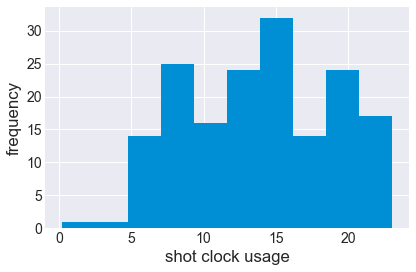

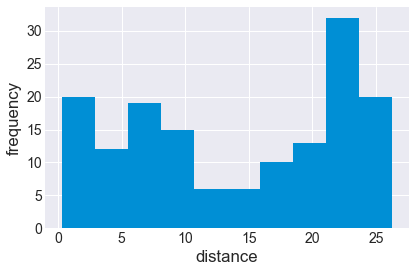

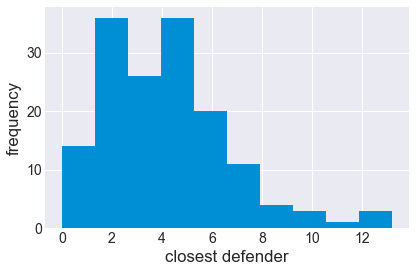

In [197]:
for fact in facts:
    fig = plt.figure()
    shot_df[fact].hist()
    plt.xlabel(fact)
    plt.ylabel('frequency')
    plt.tight_layout()
    fig.savefig('./figures/' + fact.replace(' ', '_') + "_hist.png", bbox_inches='tight')

In [195]:
# This code creates the timeline display from the shot_times and shot_facts arrays.
def make_timeline_graph(shot_times, shot_facts, colors, fact_type):
    fig, ax = plt.subplots(figsize=(18,6))
    fig.canvas.set_window_title('Shot Timeline')

    plt.scatter(shot_times, np.full_like(shot_times, 0), marker='o', s=50, color=colors, edgecolors='black', zorder=3, label='shot')
    plt.bar(shot_times, shot_facts, bottom=1, color=colors, edgecolor='black', width=6, label=fact_type)

    ax.spines['bottom'].set_position('zero')
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    ax.spines['left'].set_color('none')
    ax.tick_params(axis='x', length=20)
    ax.xaxis.set_major_locator(matplotlib.ticker.FixedLocator([0,720,1440,2160,2880])) 
    ax.set_yticks([])

    _, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    ax.set_xlim(-15, xmax)
    ax.set_ylim(ymin, ymax+5)
    ax.text(xmax, 2, "time", ha='right', va='top', size=10)
    plt.legend(ncol=5, loc='upper left')

    plt.tight_layout()
    plt.show()
    fig.savefig('./figures/' + fact_type.replace(' ', '_') + ".png")

13 [10, 47, 48, 92, 118, 136, 137, 138, 145, 177, 178, 179, 180]
23.04 94


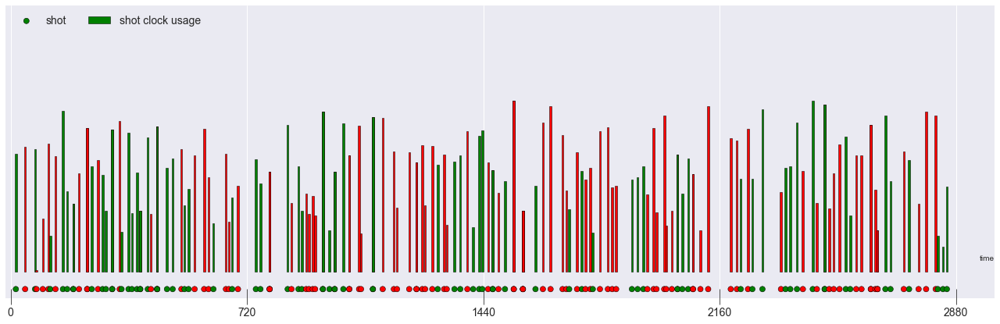

28 [4, 6, 10, 12, 23, 30, 48, 63, 66, 71, 83, 89, 92, 100, 101, 102, 107, 108, 113, 118, 122, 129, 136, 138, 145, 149, 173, 174]
26.288063783628118 86


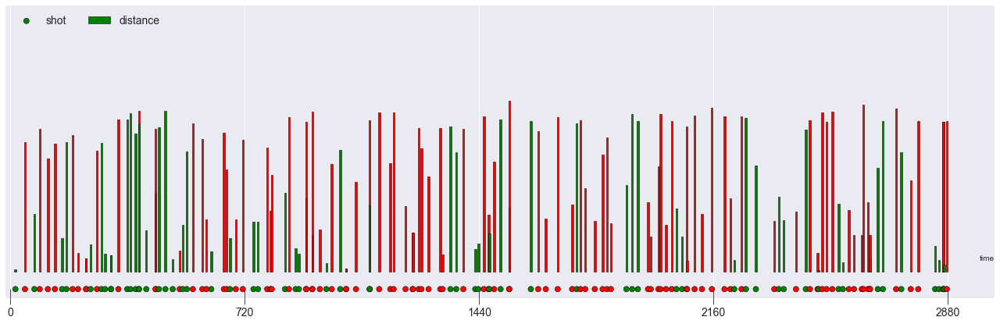

27 [4, 6, 10, 12, 23, 30, 48, 66, 71, 83, 89, 92, 100, 101, 102, 107, 108, 113, 118, 122, 129, 136, 138, 145, 149, 173, 174]
13.200472751416898 130


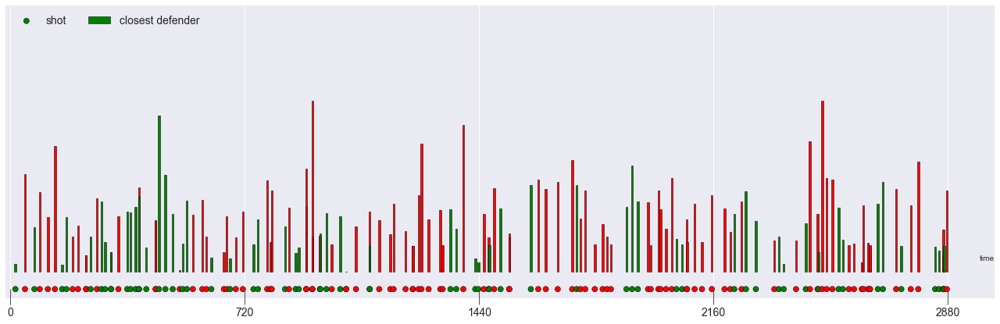

In [196]:
for fact_type in facts:
    colors = []
    errors = []
    shot_times, shot_facts = [], []
    c_map = list(shot_df['EVENTMSGTYPE'].apply(lambda x: 'g' if x == 1 else 'r'))
    for idx in range(len(shot_df)):
        try:
            time, fact = get_shot_fact_from_event(idx, fact_type=fact_type)
            shot_times.append(time)
            shot_facts.append(fact)
            colors.append(c_map[idx])
        except:
            errors.append(idx)

    print(len(errors), errors)
    print(max(shot_facts), shot_facts.index(max(shot_facts)))
    shot_facts = [sf * (10 / max(shot_facts)) for sf in shot_facts]  # scale between 0 and 10
    make_timeline_graph(shot_times, shot_facts, colors, fact_type)


In [22]:
# thanks to @dvatterott for the open source code!
import math

# Animation function / loop
def draw_court(axis):
    img = mpimg.imread('./nba_court_T.png')
    plt.imshow(img,extent=axis, zorder=0)

def animate(n): #matplotlib's animation function loops through a function n times that draws a different frame on each iteration
    for i,ii in enumerate(player_xy[n]): #loop through all the players
        player_circ[i].center = (ii[1], ii[2]) #change each players xy position
        if np.linalg.norm(np.array([ii[1], ii[2]]) - np.array([ball_xy[n,0],ball_xy[n,1]])) <= 2:
            player_text[i].set_text("@") #draw the text for each player. 
        else:
            player_text[i].set_text(str(jerseydict[ii[0]])) #draw the text for each player. 
        if np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket1_coords) <= 3 and ball_xy[n, 2] >= 9.5:
            basket1.set_color('b')
        else:
            basket1.set_color('g')
        if np.linalg.norm([ball_xy[n,0],ball_xy[n,1]] - basket2_coords) <= 3 and ball_xy[n, 2] >= 9.5:
            basket2.set_color('b')
        else:
            basket2.set_color('g')
            
        player_text[i].set_x(ii[1]) #set the text x position
        player_text[i].set_y(ii[2]) #set text y position
    ball_circ.center = (ball_xy[n,0],ball_xy[n,1]) #change ball xy position
    ball_circ.radius = 1.1
    return tuple(player_text) + tuple(player_circ) + (ball_circ,)

def init(): #this is what matplotlib's animation will create before drawing the first frame. 
    for i in range(10): #set up players
        player_text[i].set_text('')
        ax.add_patch(player_circ[i])
    ax.add_patch(ball_circ) #create ball
    ax.add_patch(basket1)
    ax.add_patch(basket2)
    # ax.add_patch(test)
    ax.axis('off') #turn off axis
    dx = 5
    plt.xlim([0-dx,100+dx]) #set axis
    plt.ylim([0-dx,50+dx])  
    return tuple(player_text) + tuple(player_circ) + (ball_circ,)

10


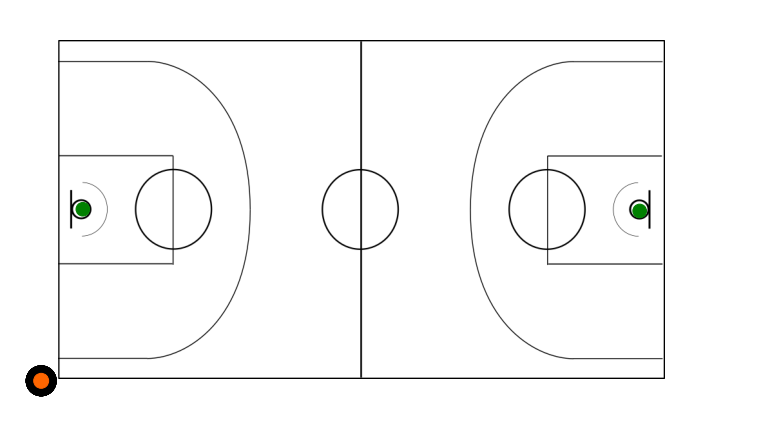

In [104]:
for event_idx in range(10, len(shot_df)):
    print(event_idx)
    try:
        ball_xy, player_xy = get_all_coords_from_event(event_idx)
        fig = plt.figure(figsize=(15,7.5)); #create figure object
        ax = plt.gca(); #create axis object

        draw_court([2.5,91.75,0.25,50]) #draw the court
        player_text = [0] * 10 #create player text vector
        player_circ = [0] * 10 #create player circle vector
        ball_circ = plt.Circle((0,0), 1.1, color=[1, 0.4, 0]); #create circle object for ball
        basket2 = plt.Circle((88.08, 25,25), 1.0, color='g');
        basket1 = plt.Circle((6.13, 25.25), 1.0, color='g');
        # test = plt.Circle((29.85247, 19.75213), 1.0, color='b');
        for i in range(10): #create circle object and text object for each player
            col=['w','k'] if i<5 else ['k','w'] #color scheme
            player_circ[i] = plt.Circle((0,0), 2.2, facecolor=col[0],edgecolor='k'); #player circle
            player_text[i] = ax.text(0,0,'',color=col[1],ha='center',va='center'); #player jersey # (text)

        ani = animation.FuncAnimation(fig, animate, frames=np.arange(0,np.size(ball_xy,0)), init_func=init, blit=True, interval=5, repeat=False, save_count=0); #function for making video
        ani.save('animations/' + str(event_idx).zfill(3) + '.gif', writer='imagemagick', fps=30)
    except:
        pass
    break


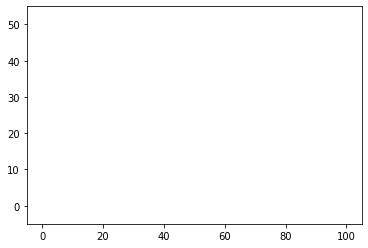

In [171]:
matplotlib.rcParams['animation.embed_limit'] = 400000000
from IPython.display import HTML

HTML(ani.to_jshtml())